In [1]:
%matplotlib inline

In [2]:
import torch
import utils
from tqdm import tqdm
from unet import Unet
import os
import numpy as np
import argparse

In [3]:
torch.backends.cudnn.deterministic = True
seed = 1234
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

In [4]:
run_name='demo'
noisy_file='demo.wav'
samples_dir='samples'
LR=0.001
num_iter=5000
save_every=250

In [5]:
# Initiate model
nlayers = 6
model = Unet(nlayers=nlayers, nefilters=60).cuda()
samples_dir = os.path.join(samples_dir, run_name)
utils.makedirs(samples_dir)

unet


In [1]:
# load data
def DataLoader(noisy_file):
    target, sr = utils.load_wav_to_torch(noisy_file)
    target = target[:(len(target)//2**nlayers) * 2**nlayers]
    target = target/utils.MAX_WAV_VALUE
    input = torch.rand_like(target)
    input = (input - 0.5) * 2
    target, input = target, input
    return target, sr, input

In [7]:
# Initialize accumulator
def AccuInit(target, sr):
    nfft = 512
    residual = 10 ** (-30 / 10)  # -18 db lower gain
    low_cut = 10
    high_cut = 90
    center = False
    bandpass = int(round(3 / 512 * nfft))
    accumulator = utils.Accumulator(target, low_cut, high_cut, nfft, center, residual, sr, bandpass)
    return accumulator

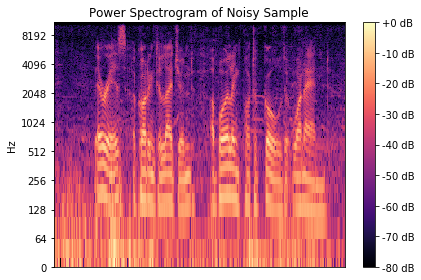

In [8]:
#show noisy sample
t, p, i = DataLoader('wav_files/noisy_samples/p232_021.wav')
a = AccuInit(t,p)
a.show_noisy()

  0%|          | 0/5000 [00:00<?, ?it/s]/home/moshe/ext/anaconda3/envs/singing/lib/python3.6/site-packages/torch/nn/functional.py:2351: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
  5%|▍         | 249/5000 [00:19<06:13, 12.74it/s]

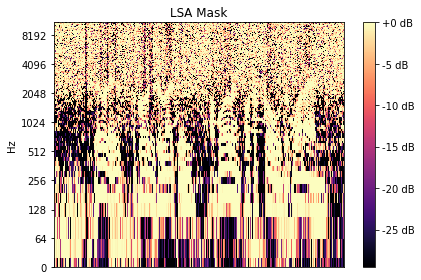

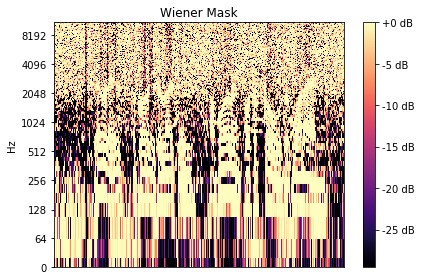

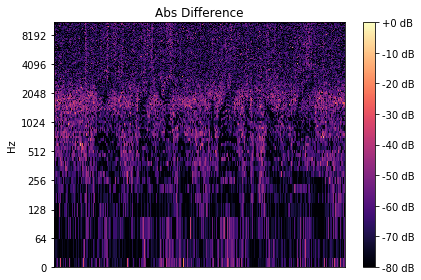

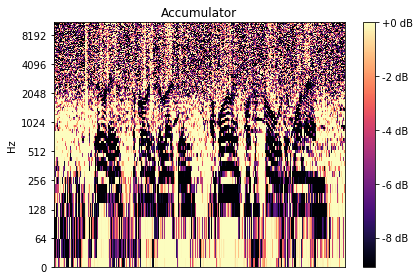

/home/moshe/ext/anaconda3/envs/singing/lib/python3.6/site-packages/torch/nn/functional.py:2351: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
 10%|▉         | 499/5000 [00:42<05:52, 12.76it/s]

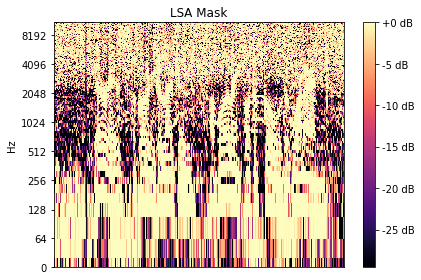

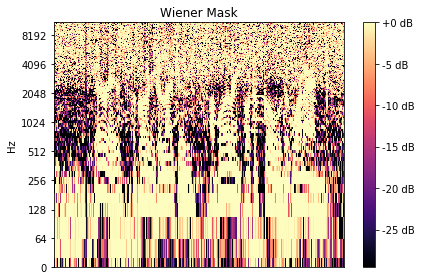

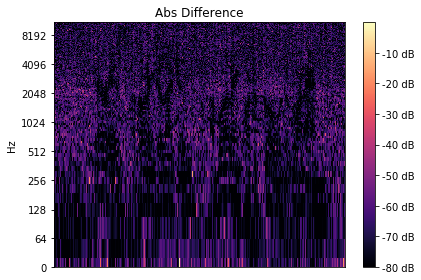

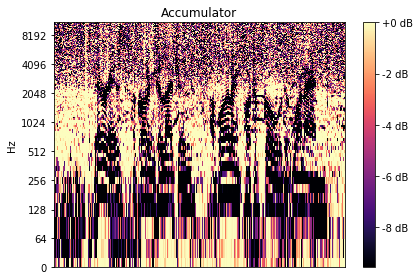

 15%|█▍        | 749/5000 [01:05<05:36, 12.64it/s]

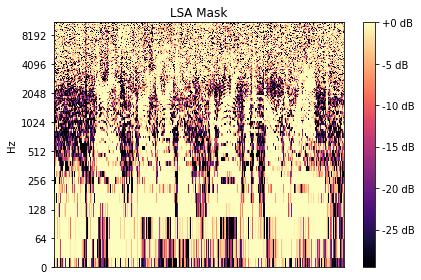

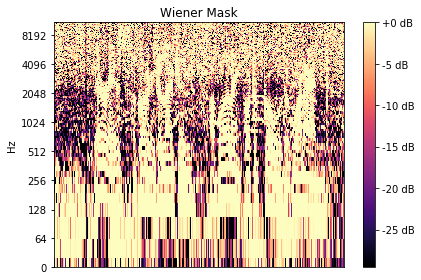

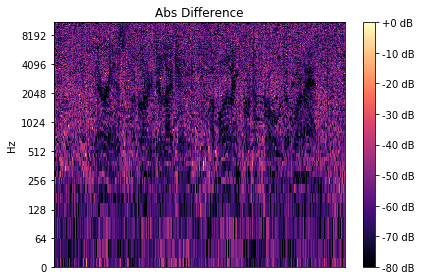

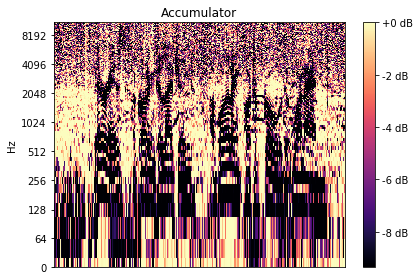

 20%|█▉        | 999/5000 [01:27<05:18, 12.57it/s]

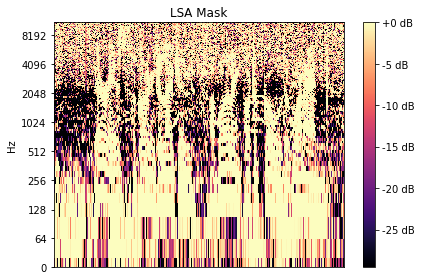

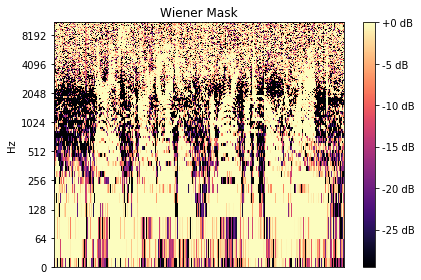

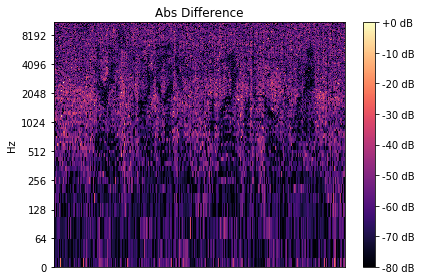

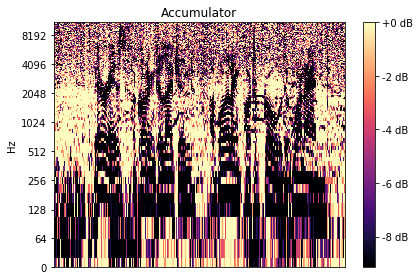

 25%|██▍       | 1249/5000 [01:50<04:50, 12.92it/s]

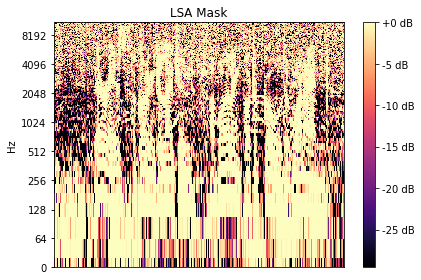

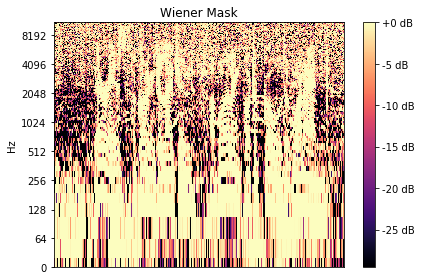

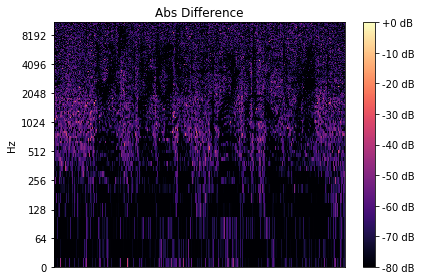

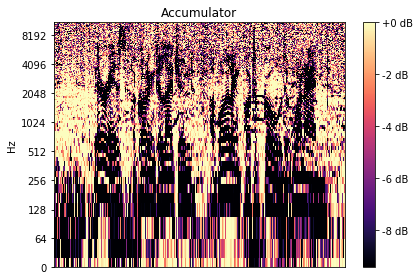

 30%|██▉       | 1499/5000 [02:12<04:30, 12.92it/s]

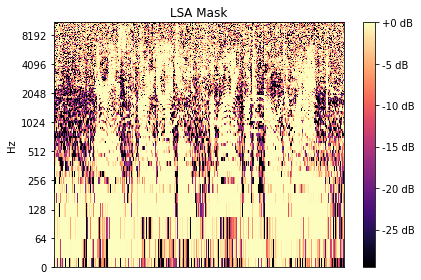

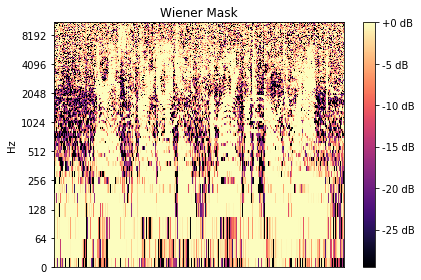

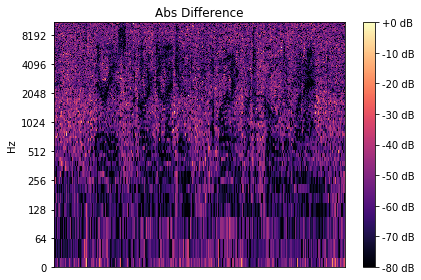

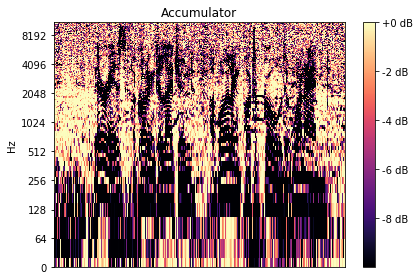

 35%|███▍      | 1749/5000 [02:35<04:15, 12.73it/s]

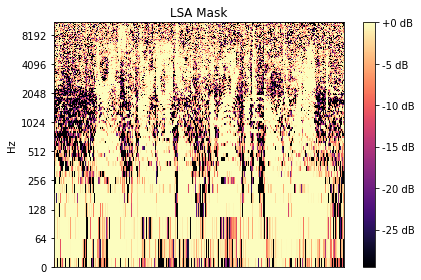

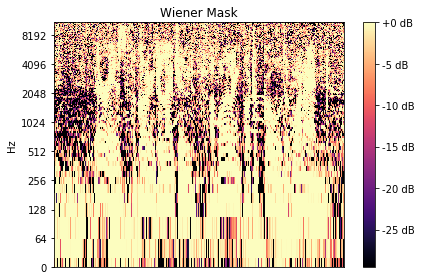

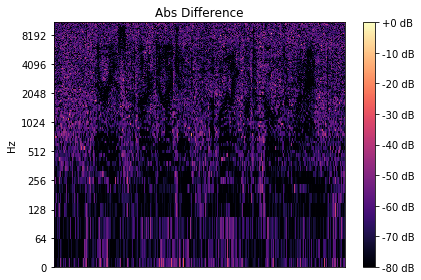

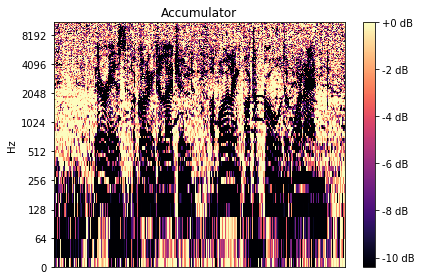

 40%|███▉      | 1999/5000 [02:58<04:06, 12.16it/s]

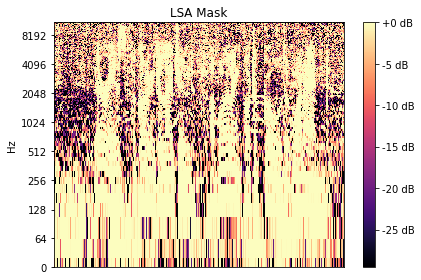

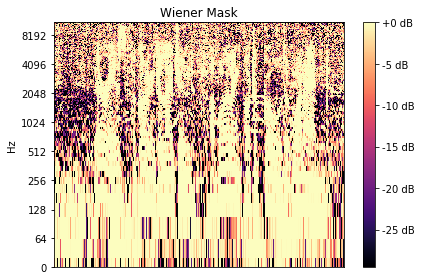

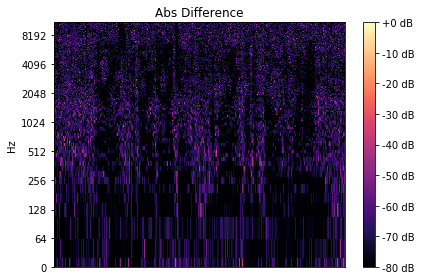

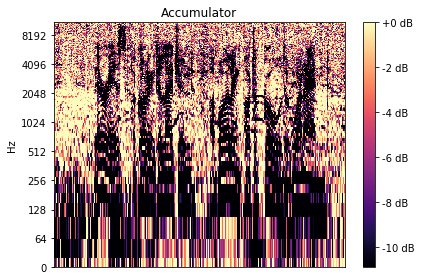

 45%|████▍     | 2249/5000 [03:20<03:36, 12.72it/s]

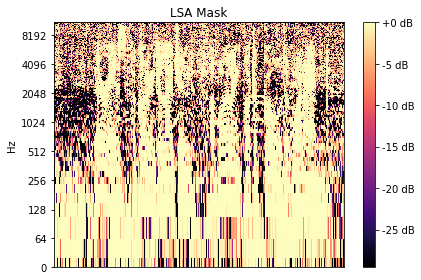

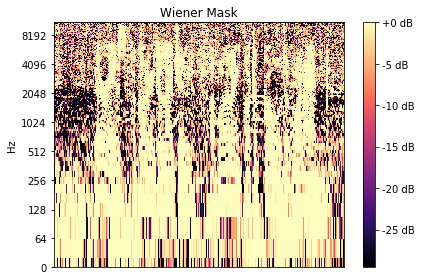

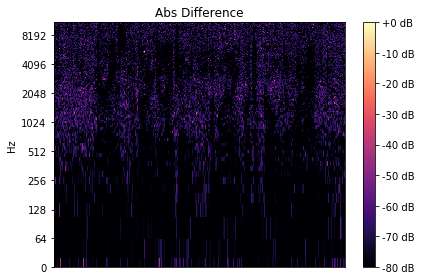

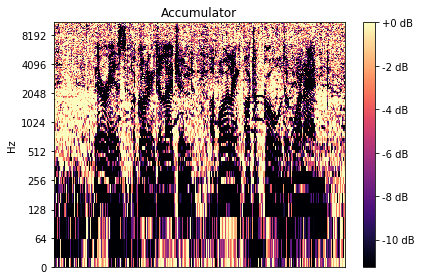

 50%|████▉     | 2499/5000 [03:43<03:16, 12.70it/s]

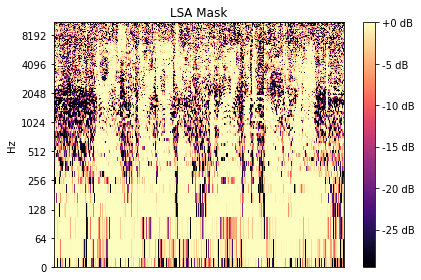

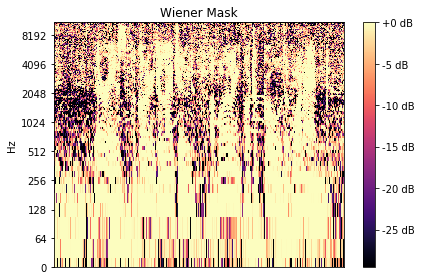

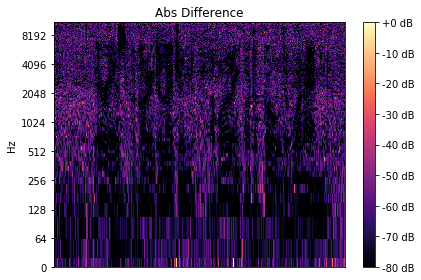

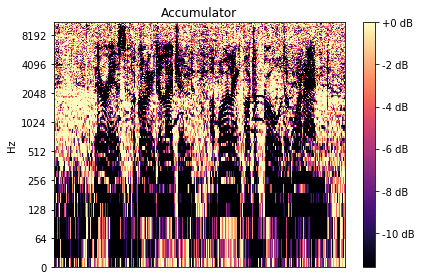

 55%|█████▍    | 2749/5000 [04:05<02:54, 12.87it/s]

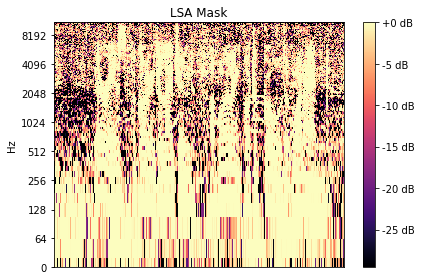

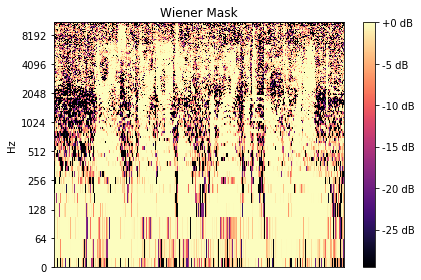

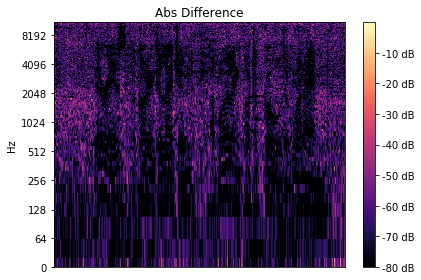

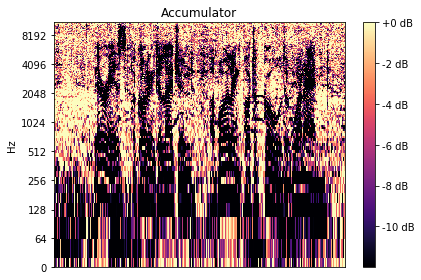

 60%|█████▉    | 2999/5000 [04:28<02:43, 12.23it/s]

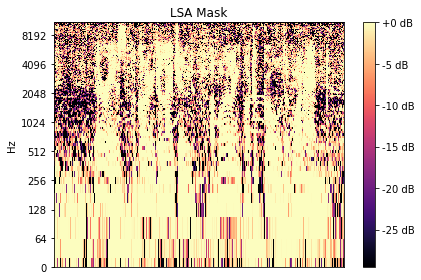

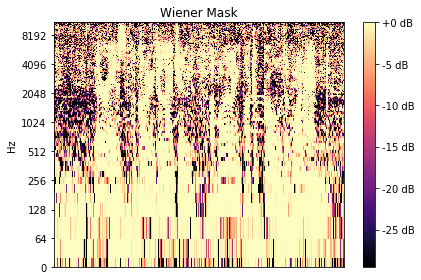

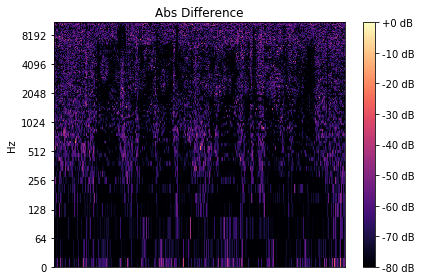

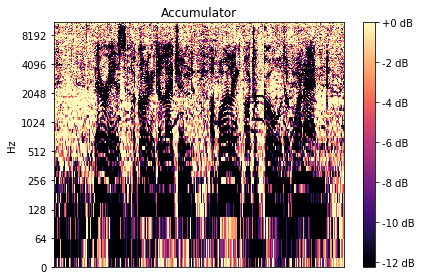

 65%|██████▍   | 3249/5000 [04:50<02:16, 12.86it/s]

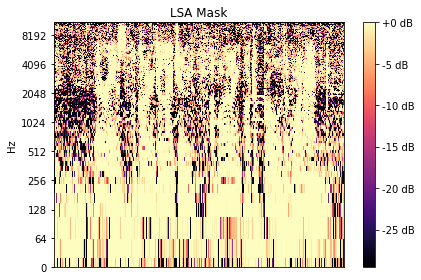

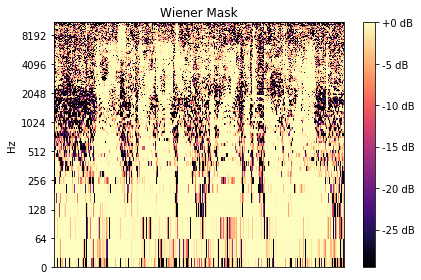

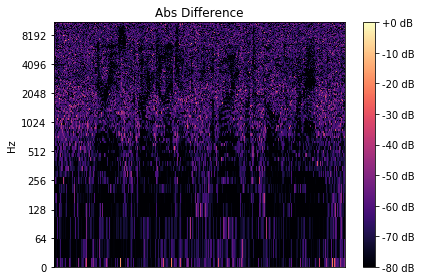

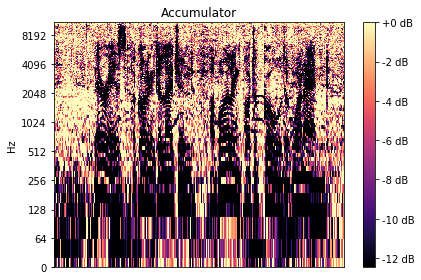

 70%|██████▉   | 3499/5000 [05:13<01:58, 12.71it/s]

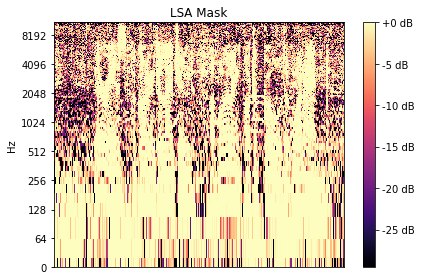

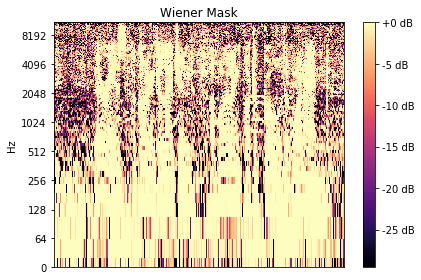

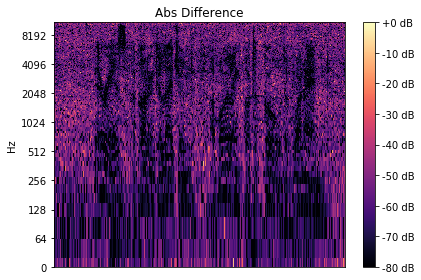

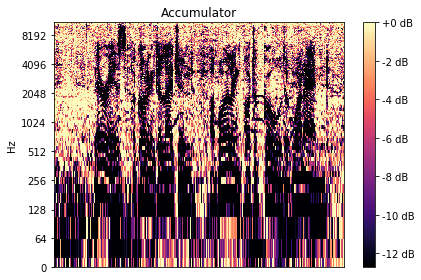

 75%|███████▍  | 3749/5000 [05:35<01:40, 12.49it/s]

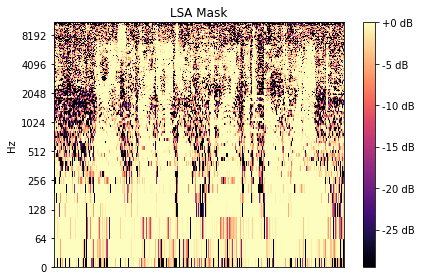

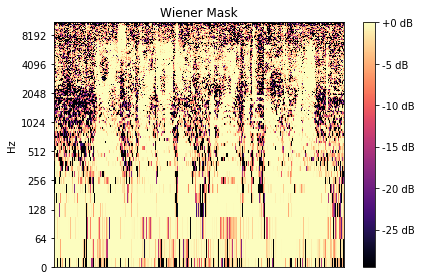

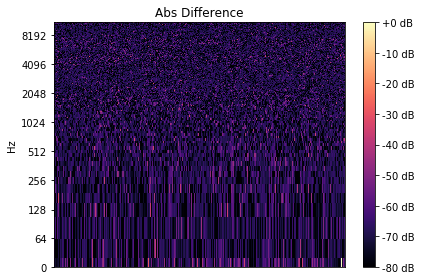

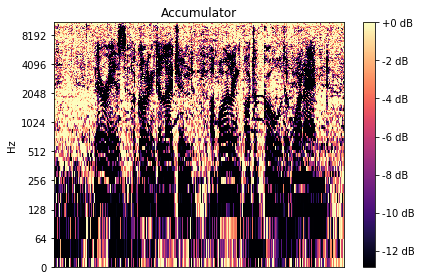

 80%|███████▉  | 3999/5000 [05:58<01:23, 12.04it/s]

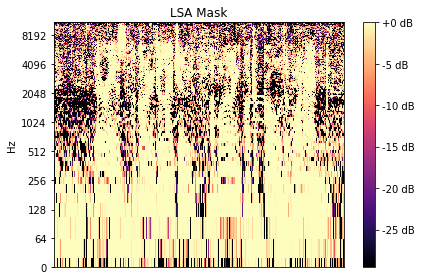

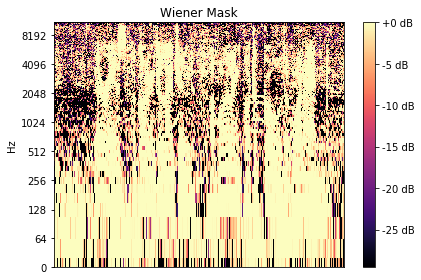

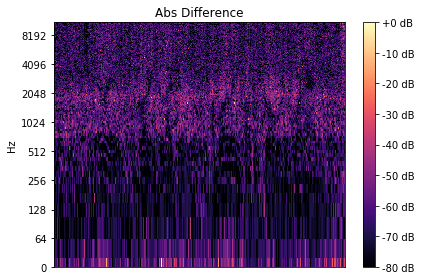

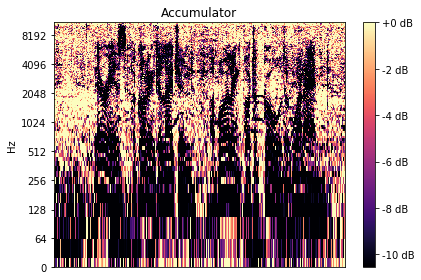

 85%|████████▍ | 4249/5000 [06:20<00:58, 12.85it/s]

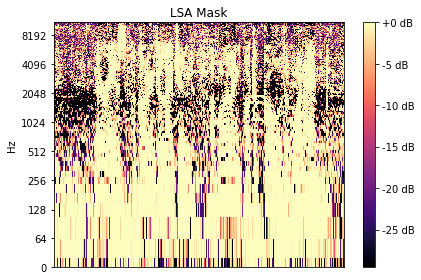

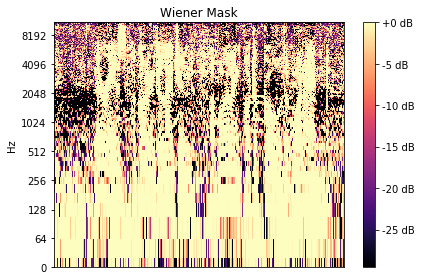

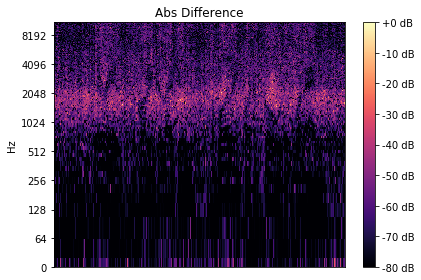

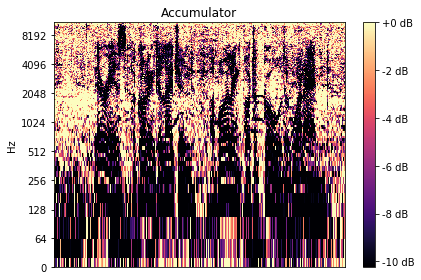

 90%|████████▉ | 4499/5000 [06:43<00:40, 12.28it/s]

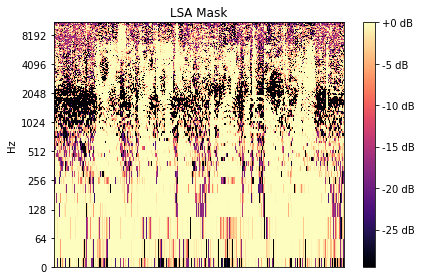

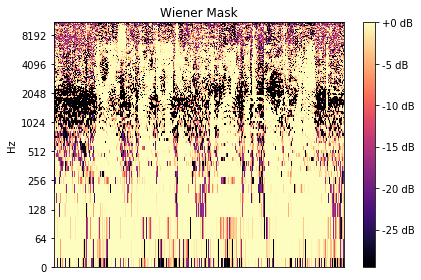

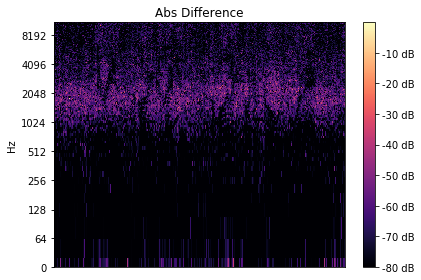

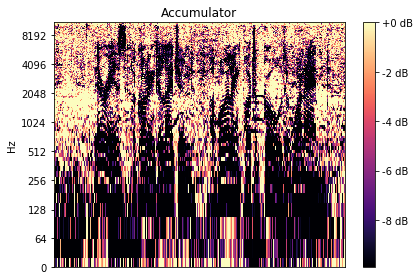

 95%|█████████▍| 4749/5000 [07:05<00:20, 12.31it/s]

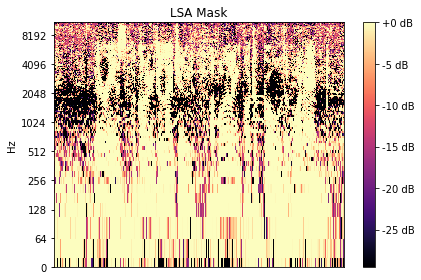

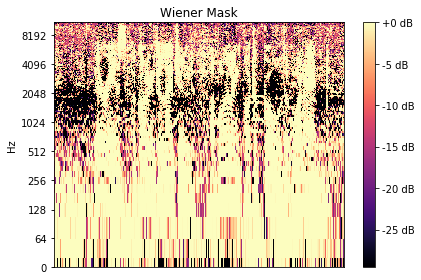

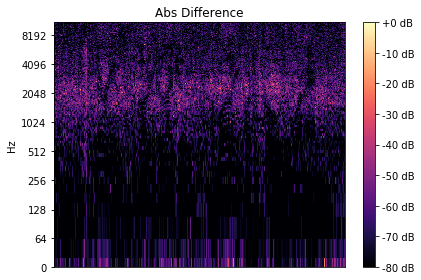

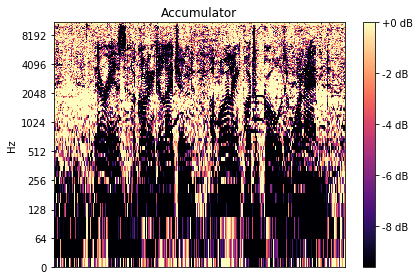

100%|█████████▉| 4999/5000 [07:28<00:00, 12.24it/s]

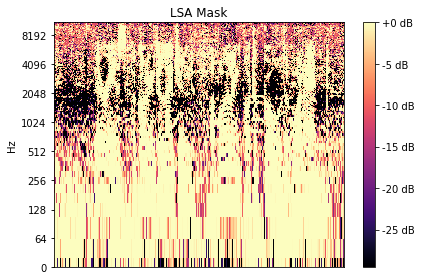

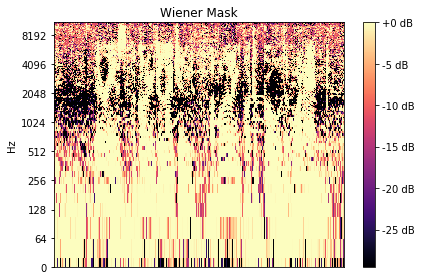

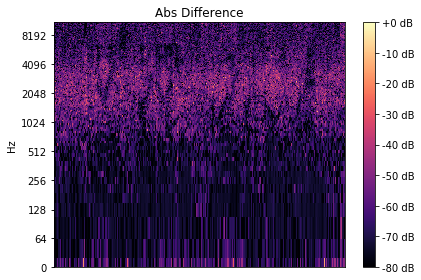

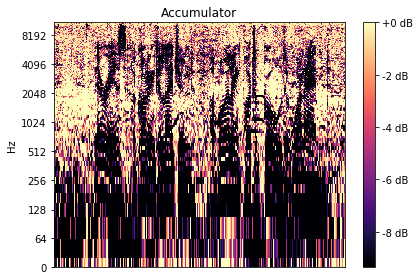

100%|██████████| 5000/5000 [07:30<00:00, 11.09it/s]


In [9]:
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

for subdir, dirs, files in os.walk(data_dir):
    for filename in files:
        filepath = subdir + os.sep + filename
        directory = samples_dir + '/' + subdir.split('/')[-1]
        
        target, sr, input = DataLoader(filepath)
        accumulator = AccuInit(target, sr)
        input = input.view(1, 1, -1)

        for j in tqdm(range(num_iter)):
            # network step
            optimizer.zero_grad()
            out = model(input)
            out = out.view(-1)
            total_loss = criterion(out, target)
            total_loss.backward()
            optimizer.step()

            # accumulating the abs difference
            stft = np.abs(utils.torch_stft(out, nfft=accumulator.nfft, center=accumulator.center))
            accumulator.sum_difference(stft, j)
        # clip & normalize mask
        accumulator.create_atten_map()
        accumulator.mmse_lsa()
        # save wiener and lsa denoised files
        utils.write_music_stft(accumulator.stft_noisy_filt * accumulator.atten_map,
                               f'{directory}/wiener_' + filename, sr, center=accumulator.center)
        utils.write_music_stft(accumulator.stft_noisy_filt * accumulator.lsa_mask,
                               f'{directory}/lsa_' + filename, sr, center=accumulator.center)
        # show outputs
        accumulator.show_lsa()
        accumulator.show_wiener()
        accumulator.show_diff_stft()
        accumulator.show_diff_accum()
        # write net output
        out_write = out.clone().detach()
        out_write = out_write.detach().cpu().numpy()
        utils.write_norm_music(out_write, f'{directory}/net_output_' + filename, sr)